In [114]:
import numpy as np
import pandas as pd
from scipy.linalg import expm, null_space, solve
from scipy.sparse.linalg import expm_multiply
import matplotlib.pyplot as plt
import networkx as nx
from networkx.algorithms.isomorphism import GraphMatcher
import pyvis.network as nt

from qlinks.lattice.square_lattice import SquareLattice
from qlinks.symmetry.gauss_law import GaussLaw
from qlinks.solver.deep_first_search import DeepFirstSearch
from qlinks.model import QuantumLinkModel
from qlinks.visualizer.graph import GraphVisualizer

In [6]:
def format_custom_index(index):
    return [f"({i}) {idx}" for i, idx in enumerate(index)]

In [3]:
def setup_model(lattice_shape, n_solution, coup_j, coup_rk):
    gauss_law = GaussLaw.from_staggered_charge_distri(*lattice_shape)
    gauss_law.flux_sector = (0, 0)
    dfs = DeepFirstSearch(gauss_law, max_steps=int(1e+8))
    basis = gauss_law.to_basis(dfs.solve(n_solution))
    model = QuantumLinkModel(coup_j, coup_rk, lattice_shape, basis)
    return basis, model

# Lattice 4x2

In [115]:
coup_j, coup_rk = (1, -1)
basis, model = setup_model(lattice_shape=(4, 2), n_solution=16, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian)

2023-12-18 13:44:53 [deep_first_search.py] INFO: Deep First Search starts.
2023-12-18 13:44:53 [deep_first_search.py] INFO: Found 16 Solutions as required in 103 steps.


In [116]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
(0) 17595,0,1,0,0,0,1,0,0,1,0,1,1,1,0,1,1
(1) 18867,0,1,0,0,1,0,0,1,1,0,1,1,0,0,1,1
(2) 19638,0,1,0,0,1,1,0,0,1,0,1,1,0,1,1,0
(3) 36135,1,0,0,0,1,1,0,1,0,0,1,0,0,1,1,1
(4) 37947,1,0,0,1,0,1,0,0,0,0,1,1,1,0,1,1
(5) 39219,1,0,0,1,1,0,0,1,0,0,1,1,0,0,1,1
(6) 39990,1,0,0,1,1,1,0,0,0,0,1,1,0,1,1,0
(7) 44307,1,0,1,0,1,1,0,1,0,0,0,1,0,0,1,1
(8) 50283,1,1,0,0,0,1,0,0,0,1,1,0,1,0,1,1
(9) 51555,1,1,0,0,1,0,0,1,0,1,1,0,0,0,1,1


In [11]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df #[evecs_df["kin"].abs() < 1e-12]

,eval,kin,pot
0,-6.561553e+00,-3.076482e+00,-3.485071
1,-5.778457e+00,-2.310811e+00,-3.467646
2,-5.561553e+00,-1.940285e+00,-3.621268
3,-4.000000e+00,-6.749917e-02,-3.932501
4,-4.000000e+00,-1.327528e+00,-2.672472
5,-4.000000e+00,-1.271640e+00,-2.728360
6,-3.000000e+00,-1.972152e-30,-3.000000
7,-3.000000e+00,-1.454462e-30,-3.000000
8,-3.000000e+00,-5.423419e-31,-3.000000
9,-2.710831e+00,7.852513e-02,-2.789357


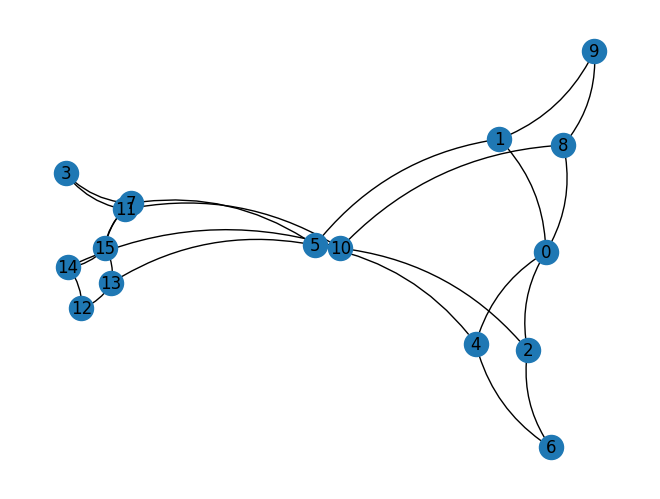

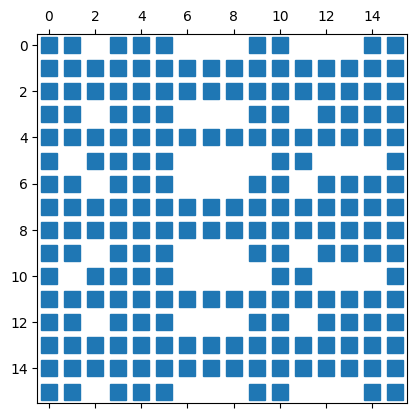

In [117]:
g = nx.from_numpy_array(-model.kinetic_term)
assert nx.is_bipartite(g)
# left, right = nx.bipartite.sets(g)
# pos = nx.bipartite_layout(g, left, align="horizontal")
pos = nx.spectral_layout(g)
pos = {k: v + np.random.normal(0, 0.05, 2) for k, v in pos.items()}
nx.draw(g, pos, with_labels=True, arrows=True, connectionstyle="arc3,rad=0.2")
plt.show()

plt.spy(evecs, precision=1e-12, markersize=12)
plt.show()

In [124]:
G_pattern = nx.Graph()
G_pattern.add_nodes_from([0, 1, 2, 3, 4, 5, 6, 7, 8])
G_pattern.add_edges_from([(0, 1), (0, 2), (1, 3), (1, 4), (2, 4), (2, 5), (3, 6), (4, 6), (4, 7), (5, 7), (6, 8), (7, 8)])

# nx.draw(G_pattern, nx.spectral_layout(G_pattern), with_labels=True)
gm = GraphMatcher(g, G_pattern)
subgraphs = set([frozenset(subgraph_nodes) for subgraph_nodes in gm.subgraph_isomorphisms_iter()])
print(subgraphs)

{frozenset({3, 5, 7, 10, 11, 12, 13, 14, 15}), frozenset({0, 1, 2, 4, 5, 6, 8, 9, 10})}


In [78]:
entropies = np.asarray([model.entropy(evecs[:, i], 1, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df

0     1.536650
1     1.899841
2     0.695771
3     1.562885
4     1.528069
5     1.600664
6     1.932517
7     1.525501
8     1.611432
9     1.481633
10    1.941802
11    0.973698
12    1.147446
13    1.309708
14    1.502661
15    1.501048
Name: entropy, dtype: float64

<Axes: >

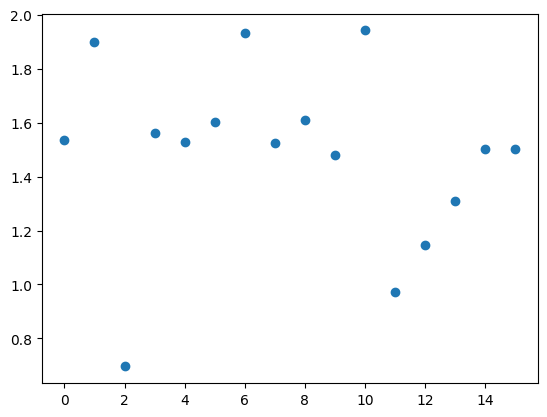

In [79]:
entropy_df.plot(style='o')

array([ 1,  2,  4,  7,  8, 11, 13, 14])

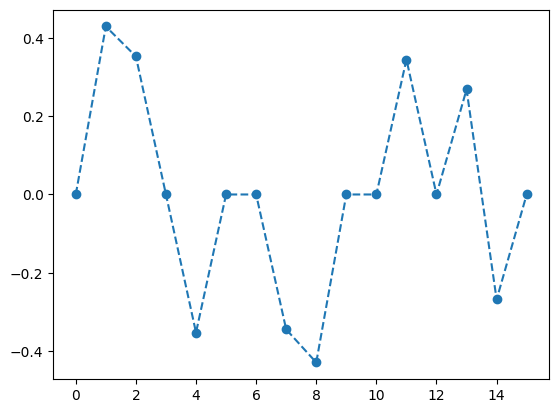

In [81]:
plt.plot(evecs[:, 8], linestyle='--', marker='o')
np.where(np.abs(evecs[:, 8]) > 0.2)[0]

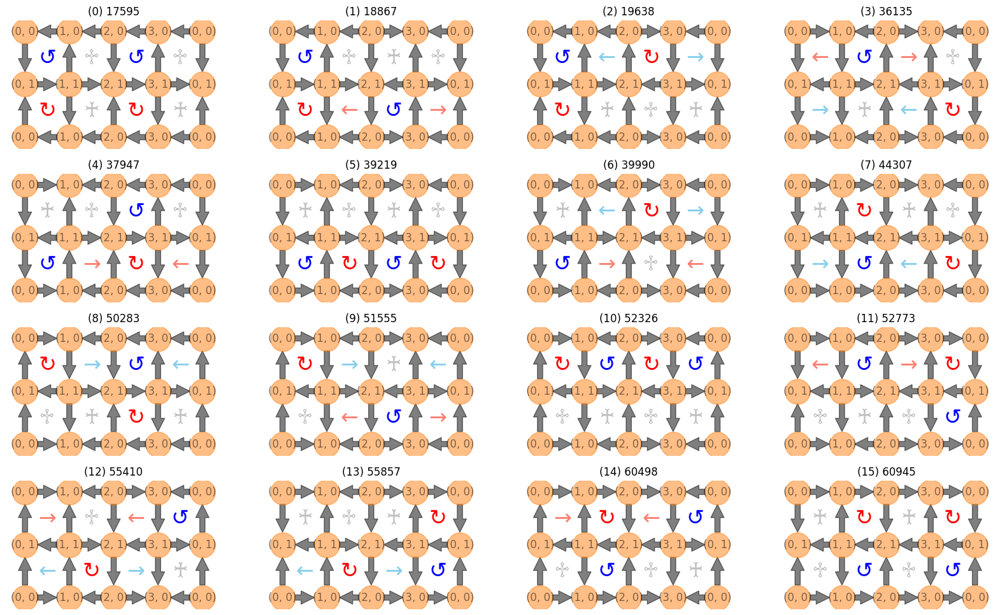

In [37]:
fig, axes = plt.subplots(4, 4, figsize=(20, 12), facecolor="white")
ax = axes.flatten()

for i in range(basis.n_states):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[i]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[i]}")

/Users/tandaolin/projects/qlinks/.venv/lib/python3.11/site-packages/scipy/sparse/linalg/_eigen/arpack/arpack.py:1272: RuntimeWarning: k >= N - 1 for N * N square matrix. Attempting to use scipy.linalg.eig instead.
  warnings.warn("k >= N - 1 for N * N square matrix. "


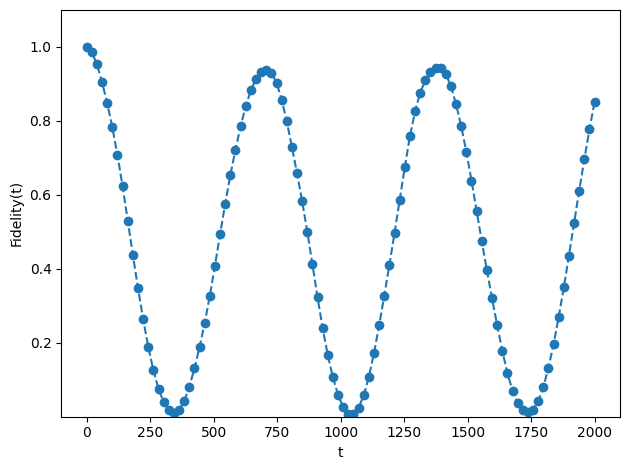

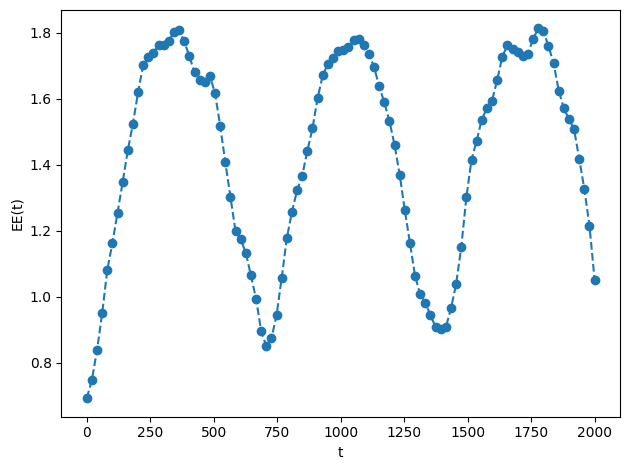

final fidelity = 0.8523796401694091
O_kin @ psi_scar = [ 0.03573328+0.06279851j  0.01264524+0.00763362j  0.00552044-0.01920577j
 -0.00927429-0.02688624j  0.01439395+0.00623692j -0.00492205-0.02138102j
  0.0192293 +0.02524652j  0.00104795+0.02089732j  0.00377173-0.01780907j
  0.01650398+0.03755199j  0.02210676+0.03040705j -0.00782556-0.00454537j
 -0.00927429-0.02688624j  0.00104795+0.02089732j -0.00782556-0.00454537j
 -0.01854857-0.05377248j]
<O_kin> = (-0.0034461988995348066+0.00038414215566797425j)
<O_pot> = (-1.4303439563722726-1.6320856892703994j)
<H> = (-1.4337901552718078-1.6317015471147316j)


In [19]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[0] = 1.1
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
scar_state[np.array([1, 2, 4, 8]), 0] = np.array([1, 1, -1, -1])
scar_state /= np.linalg.norm(scar_state)

start, stop, num = 0, 2000, 100
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), entropy, linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

In [33]:
net = nt.Network(notebook=True, filter_menu=True, select_menu=True)
net.from_nx(g)
net.show_buttons(filter_=['nodes', 'edges', 'physics'])
net.show("nx.html")

nx.html


# Lattice 4x4

In [126]:
coup_j, coup_rk = (1, 1)
basis, model = setup_model(lattice_shape=(4, 4), n_solution=132, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian)

2023-12-18 13:57:51 [deep_first_search.py] INFO: Deep First Search starts.
2023-12-18 13:57:51 [deep_first_search.py] INFO: Found 132 Solutions as required in 1626 steps.


In [127]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
(0) 1142025915,0,1,0,0,0,1,0,0,0,0,...,1,0,1,0,1,1,1,0,1,1
(1) 1143328443,0,1,0,0,0,1,0,0,0,0,...,1,0,1,0,1,1,1,0,1,1
(2) 1146285243,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
(3) 1147587771,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
(4) 1147913403,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(127) 3998411793,1,1,1,0,1,1,1,0,0,1,...,0,0,0,0,0,1,0,0,0,1
(128) 3999714321,1,1,1,0,1,1,1,0,0,1,...,0,0,0,0,0,1,0,0,0,1
(129) 4000039953,1,1,1,0,1,1,1,0,0,1,...,0,0,0,0,0,1,0,0,0,1
(130) 4004924433,1,1,1,0,1,1,1,0,1,0,...,0,0,0,0,0,1,0,0,0,1


In [84]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df[evecs_df["kin"].abs() < 1e-12]

,eval,kin,pot
47,4.0,-9.907176e-30,4.0
48,4.0,-8.923989e-30,4.0
49,4.0,-9.959369e-30,4.0
50,4.0,-6.914859e-30,4.0
51,4.0,-5.756219e-30,4.0
52,4.0,3.056836e-30,4.0
53,4.0,-2.465190e-30,4.0
54,4.0,-1.015658e-29,4.0
55,4.0,-1.005798e-29,4.0


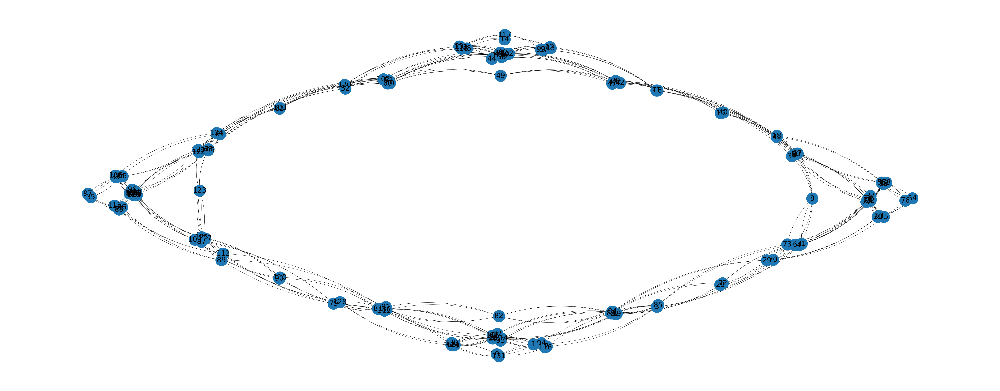

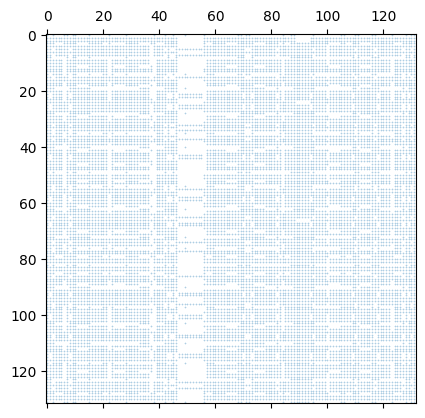

In [170]:
g = nx.from_numpy_array(-model.kinetic_term)
# left, right = nx.bipartite.sets(g)
# pos = nx.bipartite_layout(g, left, align='horizontal')
pos = nx.spectral_layout(g)
pos = {k: v + np.random.normal(0, 0.01, 2) for k, v in pos.items()}
fig = plt.figure(figsize=(82, 32))
nx.draw(g, pos, with_labels=True, node_size=5000, font_size=42, arrows=True, connectionstyle="arc3,rad=0.15")
plt.show()

plt.spy(evecs, precision=1e-12, markersize=0.1)
plt.show()

12
frozenset({3, 4, 69, 70, 6, 8, 72, 73, 82, 83, 84, 85, 27, 28, 29, 31})
frozenset({102, 103, 104, 105, 49, 50, 51, 52, 120, 121, 122, 123, 60, 61, 62, 63})
frozenset({128, 79, 80, 81, 82, 87, 89, 90, 91, 109, 110, 112, 113, 123, 125, 127})
frozenset({8, 9, 10, 11, 17, 18, 19, 20, 39, 40, 41, 42, 46, 47, 48, 49})


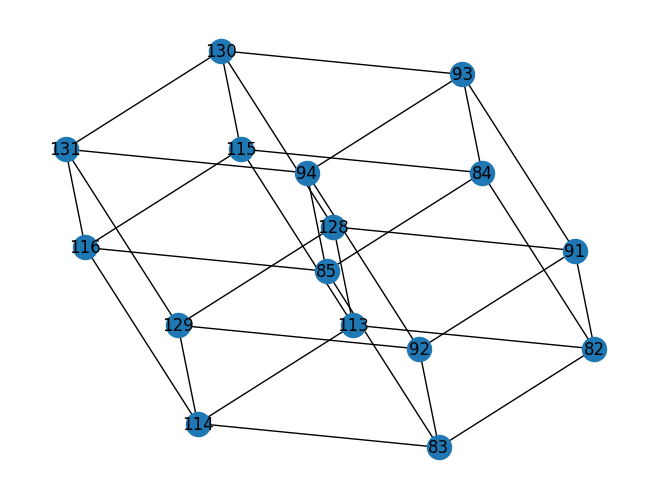

In [167]:
# G_pattern = nx.Graph()
# G_pattern.add_nodes_from([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14])
# G_pattern.add_edges_from([(0, 1), (0, 5), (2, 1), (2, 7), (1, 3), (1, 4), (3, 5), (3, 6), (4, 6), (4, 7), (5, 10), (5, 9), (6, 8), (6, 9), (7, 8), (7, 12), (8, 11), (9, 11), (10, 11), (12, 11), (3, 13), (13, 9), (4, 14), (14, 8)])
G_pattern = g.subgraph([131, 94, 116, 130, 129, 93, 92, 115, 114, 85, 84, 91, 128, 83, 82, 113])
# print(np.linalg.matrix_rank(nx.to_numpy_array(G_pattern)))

# left, right = nx.bipartite.sets(G_pattern)
nx.draw(G_pattern, nx.spectral_layout(G_pattern), with_labels=True)
gm = GraphMatcher(g, G_pattern)
subgraphs = set([frozenset(subgraph_nodes) for subgraph_nodes in gm.subgraph_isomorphisms_iter()])
print(len(subgraphs))
for subgraph in subgraphs:
    if any(head_node in list(subgraph) for head_node in [131, 0, 54, 76, 97, 35, 14, 117]):
        pass
    else:
        print(subgraph)

In [133]:
net = nt.Network(notebook=True, filter_menu=True, select_menu=True, font_color="black")
net.from_nx(g)
for node in net.nodes:
    node["title"] = str(node["id"])
net.show_buttons(filter_=['nodes', 'edges', 'physics'])
net.show("nx.html")

nx.html


102


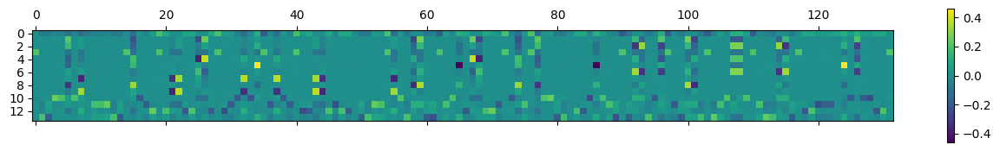

In [53]:
print(np.linalg.matrix_rank(model.kinetic_term))

plt.matshow(evecs[:, 46:60].T)
plt.colorbar()

In [54]:
entropies = np.asarray([model.entropy(evecs[:, i], 0, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df[entropy_df < 1.75]

51    1.239624
53    1.603249
55    1.675178
Name: entropy, dtype: float64

<Axes: >

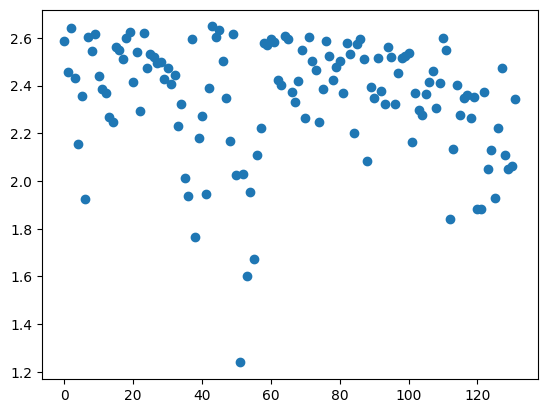

In [55]:
entropy_df.plot(style='o')

array([  0,   5,   7,  14,  15,  19,  21,  22,  25,  26,  28,  32,  34,
        35,  37,  40,  43,  44,  54,  55,  58,  59,  62,  65,  67,  68,
        72,  74,  76,  77,  86,  90,  92,  93,  96,  97, 100, 101, 103,
       107, 108, 110, 114, 115, 117, 124, 126, 131])

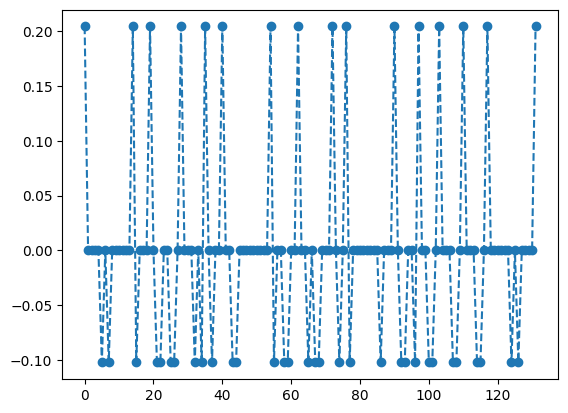

In [187]:
i = 49
plt.plot(evecs[:, i], linestyle='--', marker='o')
np.where(np.abs(evecs[:, i]) > 0.05)[0]

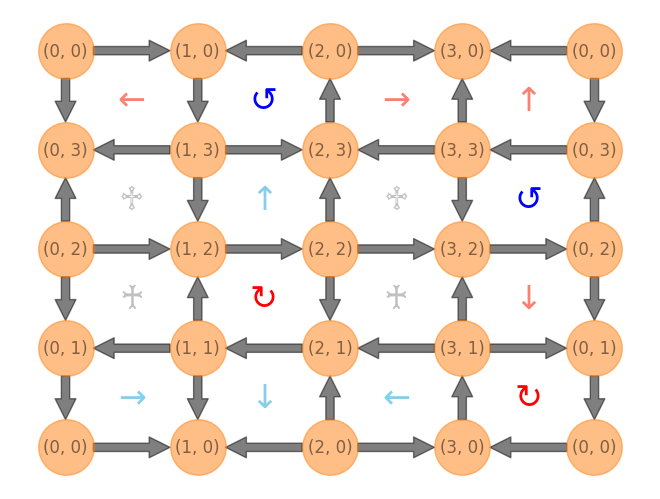

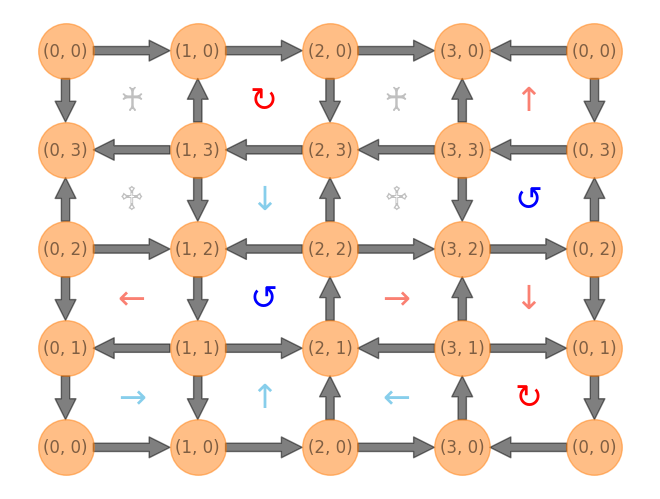

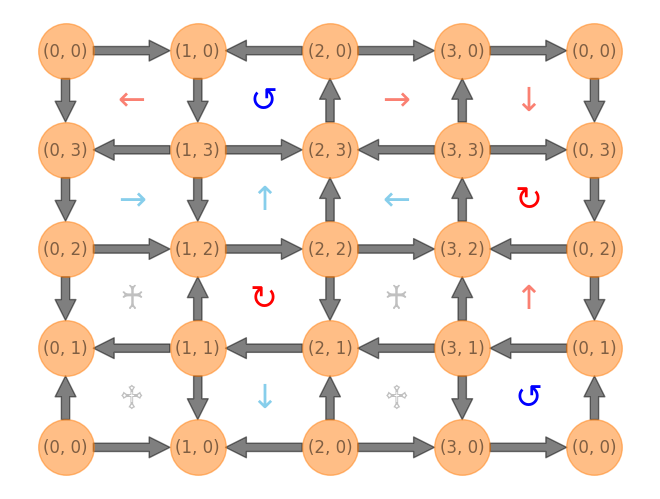

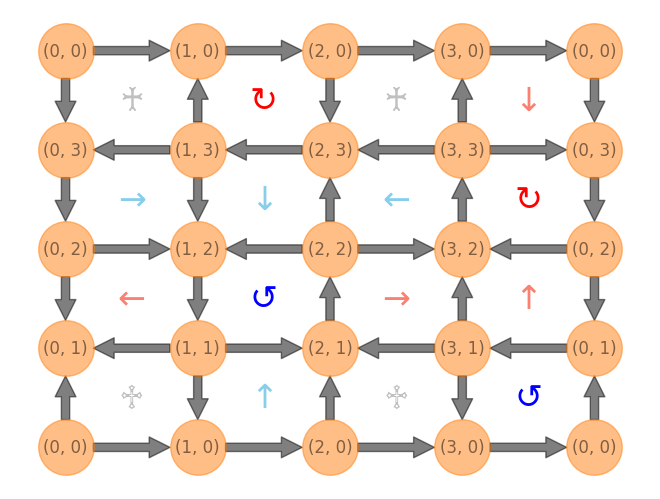

In [57]:
# {i: len(np.where(np.abs(evecs[:, i]) > 1e-12)[0]) for i in range(300)}

for i in np.where(np.abs(evecs[:, 51]) > 0.2)[0]:
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[i]))
    # plt.figure(figsize=(10, 4), facecolor='white')
    g.plot()

/Users/tandaolin/projects/qlinks/.venv/lib/python3.11/site-packages/scipy/sparse/linalg/_eigen/arpack/arpack.py:1272: RuntimeWarning: k >= N - 1 for N * N square matrix. Attempting to use scipy.linalg.eig instead.
  warnings.warn("k >= N - 1 for N * N square matrix. "


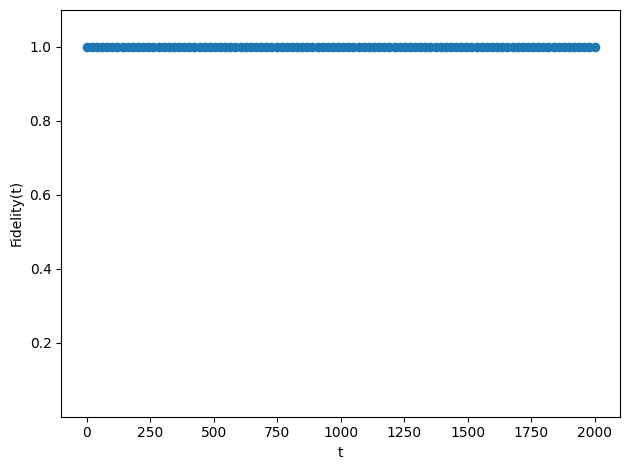

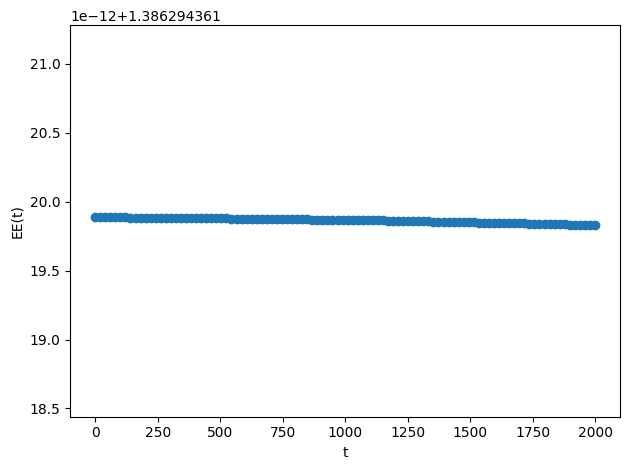

final fidelity = 0.9999999999998415
O_kin @ psi_scar = [0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j
 0.+0.j 0.+0.j]
<O_kin

In [24]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[4] = 1.1
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
scar_state[np.array([34, 65, 86, 124]), 0] = np.array([1, -1, -1, 1])
scar_state /= np.linalg.norm(scar_state)

start, stop, num = 0, 2000, 100
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), entropy, linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

# Lattice 6x2

In [92]:
coup_j, coup_rk = (1, 1)
basis, model = setup_model(lattice_shape=(6, 2), n_solution=76, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian)

2023-12-17 16:57:20 [deep_first_search.py] INFO: Deep First Search starts.
2023-12-17 16:57:20 [deep_first_search.py] INFO: Found 76 Solutions as required in 693 steps.


In [93]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
(0) 4475835,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(1) 4496307,0,1,0,0,0,1,0,0,1,0,...,1,1,1,0,1,1,0,0,1,1
(2) 4508598,0,1,0,0,0,1,0,0,1,1,...,1,1,1,0,1,1,0,1,1,0
(3) 4774695,0,1,0,0,1,0,0,0,1,1,...,1,1,0,0,1,0,0,1,1,1
(4) 4803387,0,1,0,0,1,0,0,1,0,1,...,1,1,0,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(71) 15524133,1,1,1,0,1,1,0,0,1,1,...,0,1,0,0,1,0,0,1,0,1
(72) 15566130,1,1,1,0,1,1,0,1,1,0,...,0,1,0,0,1,1,0,0,1,0
(73) 15573297,1,1,1,0,1,1,0,1,1,0,...,0,1,0,0,1,1,0,0,0,1
(74) 15648018,1,1,1,0,1,1,1,0,1,1,...,0,1,0,0,0,1,0,0,1,0


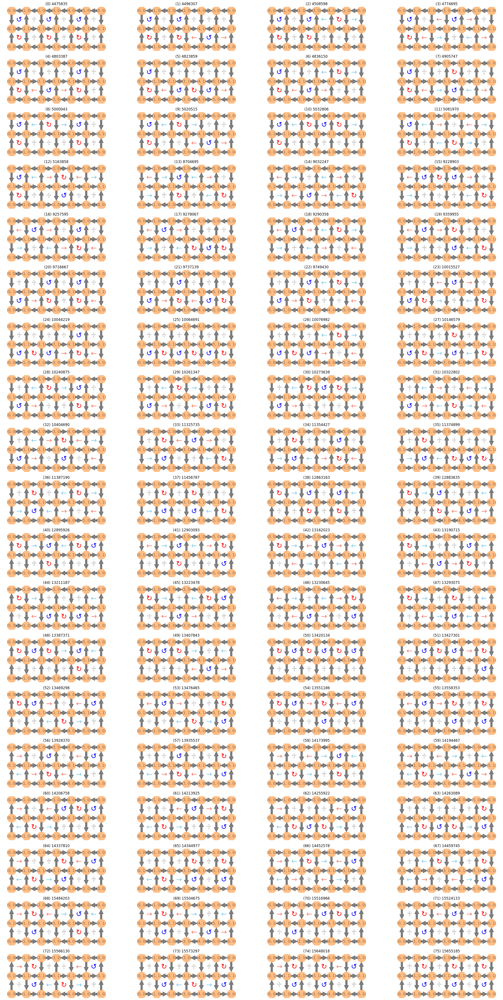

In [6]:
fig, axes = plt.subplots(19, 4, figsize=(30, 60), facecolor="white")
ax = axes.flatten()

for i in range(basis.n_states):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[i]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[i]}")

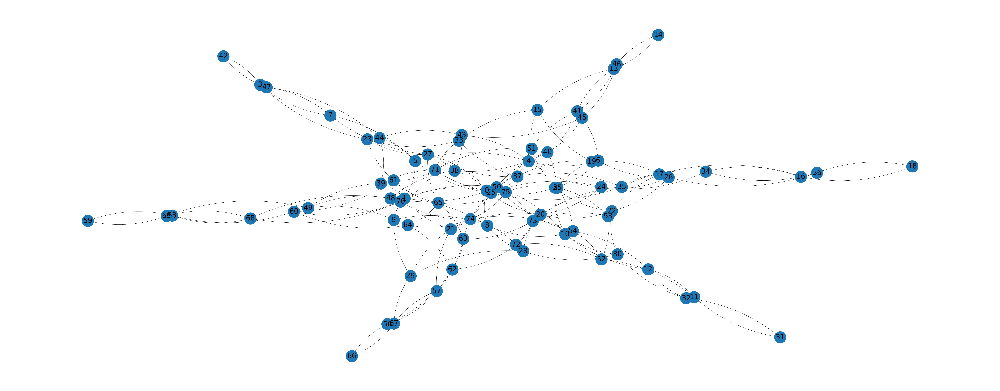

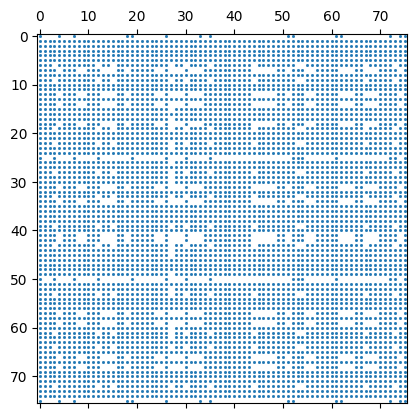

In [94]:
g = nx.from_numpy_array(-model.kinetic_term)
# left, right = nx.bipartite.sets(g)
# pos = nx.bipartite_layout(g, left, align='horizontal')
pos = nx.spectral_layout(g)
pos = {k: v + np.random.normal(0, 0.03, 2) for k, v in pos.items()}
fig = plt.figure(figsize=(82, 32))
nx.draw(g, pos, with_labels=True, node_size=5000, font_size=42, arrows=True, connectionstyle="arc3,rad=0.15")
plt.show()

plt.spy(evecs, precision=1e-12, markersize=1)
plt.show()

In [95]:
net = nt.Network(notebook=True, filter_menu=True, select_menu=True, font_color="black")
net.from_nx(g)
for node in net.nodes:
    node["title"] = str(node["id"])
net.show_buttons(filter_=['nodes', 'edges', 'physics'])
net.show("nx.html")

nx.html


In [121]:
entropies = np.asarray([model.entropy(evecs[:, i], 0, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df.loc[(entropy_df.index >= 20) & (entropy_df.index <= 50) & (entropy_df < 1.75)]

20    1.058436
21    1.059513
22    1.061746
23    1.054004
24    1.074146
25    1.075756
26    1.012101
27    1.045869
28    1.041082
29    1.036557
30    0.997521
31    1.003358
32    1.054331
33    1.045045
34    1.032524
35    1.043826
36    1.053413
37    1.049003
38    1.061464
39    1.071072
40    1.050495
41    1.034524
42    1.093099
43    1.087584
44    0.949660
45    1.050145
46    1.028086
47    1.045876
48    1.041796
49    1.025918
50    1.020980
Name: entropy, dtype: float64

<Axes: >

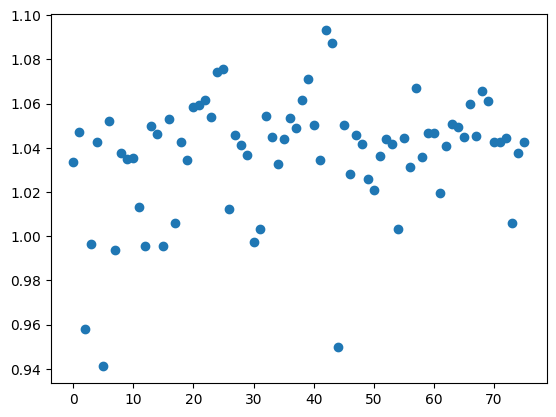

In [122]:
entropy_df.plot(style='o')

array([15, 17, 23, 26, 29, 30, 44, 45, 49, 52, 60, 62])

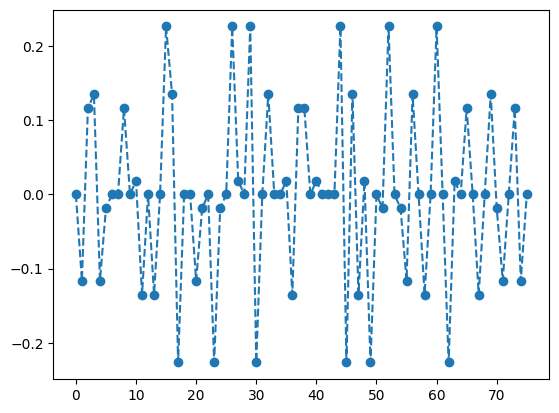

In [104]:
plt.plot(evecs[:, 44], linestyle='--', marker='o')
np.where(np.abs(evecs[:, 44]) > 0.15)[0]

In [106]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df.iloc[44] #[evecs_df["kin"].abs() < 1e-12]

eval    4.678363
kin     0.730499
pot     3.947864
Name: 44, dtype: float64

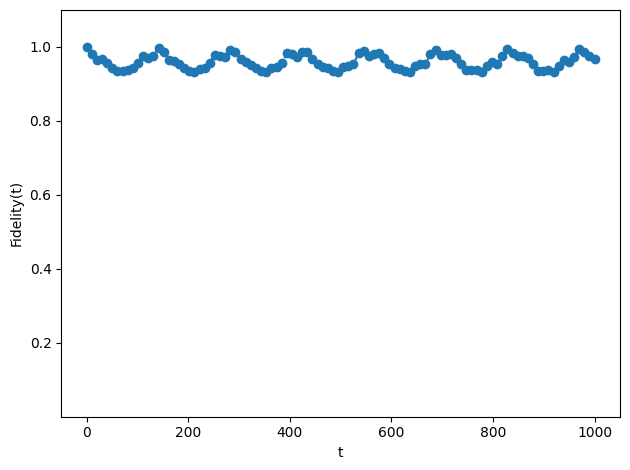

final fidelity = 0.9684200052672003
O_kin @ psi_scar = [ 4.74315894e-03-0.01351011j  1.03124779e-02+0.0318116j
 -7.33306781e-03-0.03792991j  1.52997953e-02+0.18422271j
  1.03124779e-02+0.0318116j   5.65523991e-03-0.00780859j
 -2.38554269e-03+0.01385663j -3.13183015e-03+0.0050453j
 -7.33306781e-03-0.03792991j -2.38554269e-03+0.01385663j
 -8.56180912e-03-0.00084907j -1.06443298e-02-0.21186007j
  3.77536184e-03+0.01009899j -6.65967834e-02-0.23316644j
  4.68541366e-03+0.00990252j  4.80413953e-02+0.15468343j
  8.00044595e-02+0.21580224j -5.40763198e-02-0.1522819j
 -1.46383257e-02-0.00309953j  2.79780403e-03-0.00045922j
  8.00265490e-03+0.03862601j -4.03437097e-03+0.01099935j
 -8.74394704e-03+0.02450193j -6.58516552e-03-0.12468163j
 -4.03437097e-03+0.01099935j -5.63272425e-04+0.00214595j
  4.15657095e-02+0.13874161j -8.01670083e-03+0.00049375j
 -8.74394704e-03+0.02450193j  4.15657095e-02+0.13874161j
 -2.04103940e-02-0.15438129j -1.65784189e-02-0.00708621j
  4.32299982e-02+0.22165957j -1.0178

In [130]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[0] = 1.05
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

# scar_state = np.zeros((basis.n_states, 1))
# scar_state[np.array([30, 45, 49, 26, 29, 44, 15, 52, 60, 17, 23, 62]), 0] = np.array([-1, -1, -1, 1, 1, 1, 1, 1, 1, -1, -1, -1])  # based on 44
# scar_state[np.array([3, 11, 16, 32, 36, 47, 58, 69]), 0] = np.array([1, -1, -1, 1, 1, -1, 1, -1])  # based on 24
# scar_state /= np.linalg.norm(scar_state)
scar_state = evecs[:, 44]

start, stop, num = 0, 2000, 100
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), entropy, linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

# Lattice 6x4

In [107]:
coup_j, coup_rk = (1, 1)
basis, model = setup_model(lattice_shape=(6, 4), n_solution=1456, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian)

2023-12-17 17:29:03 [deep_first_search.py] INFO: Deep First Search starts.
2023-12-17 17:29:12 [deep_first_search.py] INFO: Found 1456 Solutions as required in 27921 steps.


In [108]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,...,38,39,40,41,42,43,44,45,46,47
(0) 75046264433595,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(1) 75046599846843,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(2) 75051631045563,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(3) 75051966458811,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(4) 75053308111803,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(1451) 262694465618193,1,1,1,0,1,1,1,0,1,1,...,0,1,0,0,0,1,0,0,0,1
(1452) 262694801031441,1,1,1,0,1,1,1,0,1,1,...,0,1,0,0,0,1,0,0,0,1
(1453) 262694884884753,1,1,1,0,1,1,1,0,1,1,...,0,1,0,0,0,1,0,0,0,1
(1454) 262696142684433,1,1,1,0,1,1,1,0,1,1,...,0,1,0,0,0,1,0,0,0,1


In [140]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df.iloc[254]  #[evecs_df["kin"].abs() < 1e-4]

eval    4.000000
kin    -0.071014
pot     4.071014
Name: 254, dtype: float64

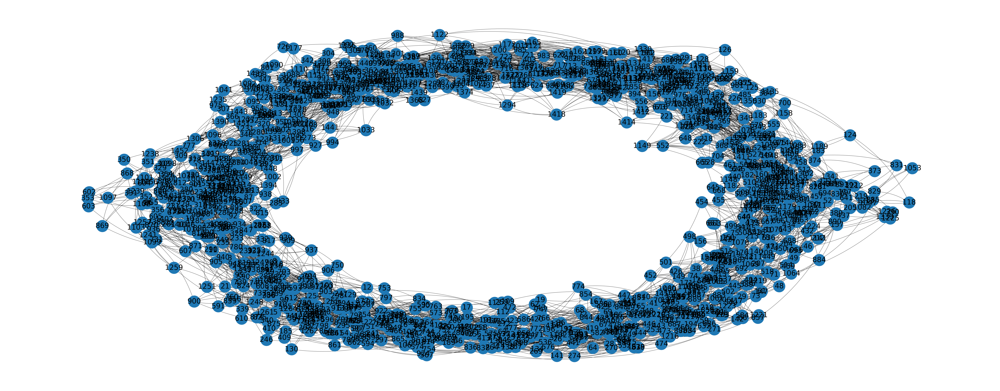

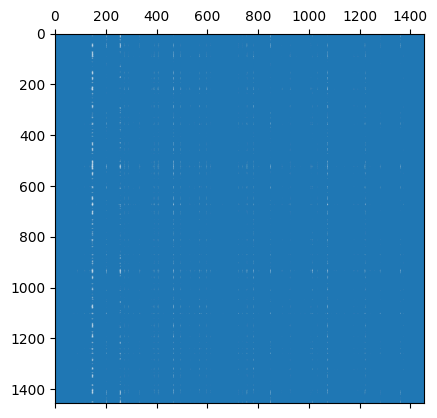

In [109]:
g = nx.from_numpy_array(-model.kinetic_term)
# left, right = nx.bipartite.sets(g)
# pos = nx.bipartite_layout(g, left, align='horizontal')
pos = nx.spectral_layout(g)
pos = {k: v + np.random.normal(0, 0.08, 2) for k, v in pos.items()}
fig = plt.figure(figsize=(82, 32))
nx.draw(g, pos, with_labels=True, node_size=5000, font_size=42, arrows=True, connectionstyle="arc3,rad=0.15")
plt.show()

plt.spy(evecs, precision=1e-12, markersize=0.05)
plt.show()

In [110]:
net = nt.Network(notebook=True, filter_menu=True, select_menu=True, font_color="black")
net.from_nx(g)
for node in net.nodes:
    node["title"] = str(node["id"])
net.show_buttons(filter_=['nodes', 'edges', 'physics'])
net.show("nx.html")

nx.html


In [136]:
entropies = np.asarray([model.entropy(evecs[:, i], 0, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df[entropy_df < 1.6]

254     0.768489
1219    1.511229
Name: entropy, dtype: float64

<Axes: >

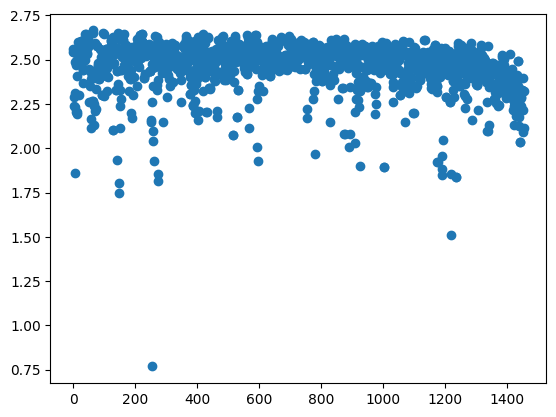

In [137]:
entropy_df.plot(style='o')

array([ 367,  390,  655,  695, 1099, 1102, 1239, 1256])

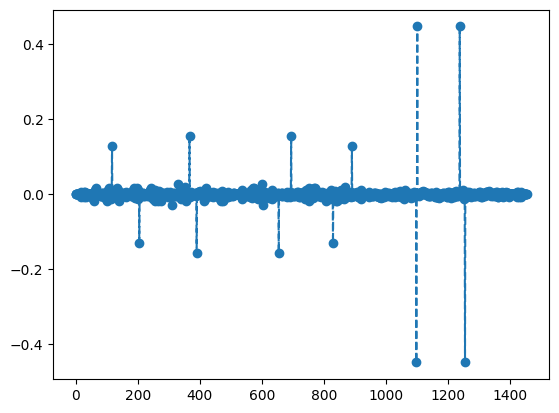

In [139]:
plt.plot(evecs[:, 254], linestyle='--', marker='o')
np.where(np.abs(evecs[:, 254]) > 0.15)[0]

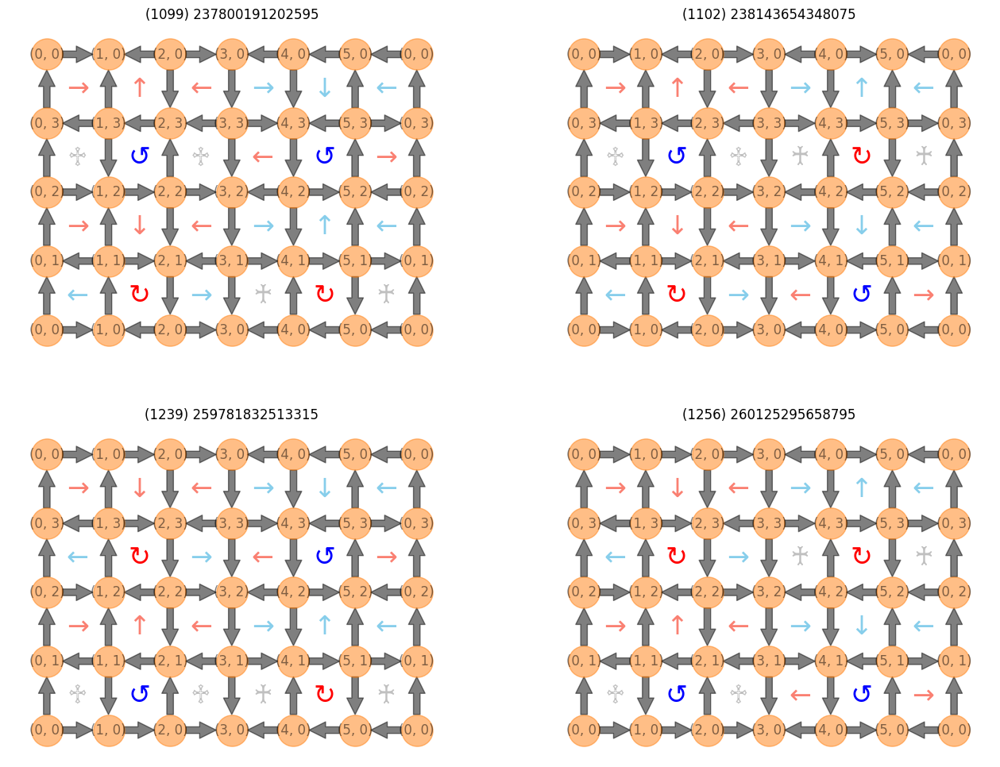

In [143]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12), facecolor="white")
ax = axes.flatten()

for i, val in enumerate([1099, 1102, 1239, 1256]):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[val]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[val]}")

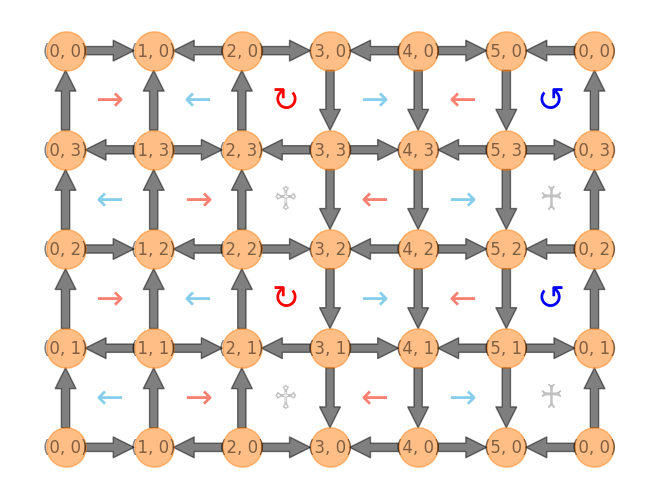

In [113]:
g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[1213]))
g.plot(node_size=800)

/Users/tandaolin/projects/qlinks/.venv/lib/python3.11/site-packages/scipy/sparse/linalg/_eigen/arpack/arpack.py:1272: RuntimeWarning: k >= N - 1 for N * N square matrix. Attempting to use scipy.linalg.eig instead.
  warnings.warn("k >= N - 1 for N * N square matrix. "


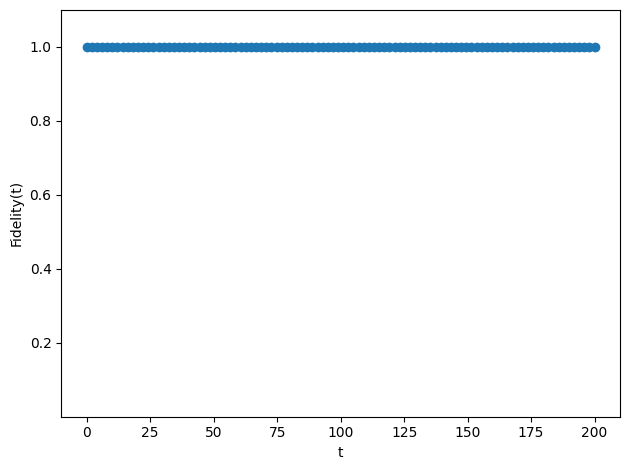

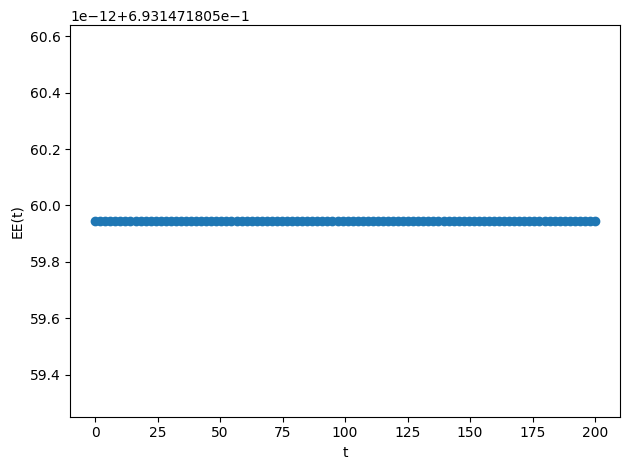

final fidelity = 1.000000000000004
O_kin @ psi_scar = [0.+0.j 0.+0.j 0.+0.j ... 0.+0.j 0.+0.j 0.+0.j]
<O_kin> = 0j
<O_pot> = (-2.3934538551791857+3.204899162708247j)
<H> = (-2.3934538551791857+3.204899162708247j)


In [42]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[0] = 1.1
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
scar_state[np.array([1099, 1102, 1239, 1256]), 0] = np.array([1, -1, -1, 1])
scar_state /= np.linalg.norm(scar_state)

start, stop, num = 0, 200, 100
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), entropy, linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

# Lattice 8x4

In [ ]:
coup_j, coup_rk = (1, 1)
gauss_law = GaussLaw.from_staggered_charge_distri(8, 4)
gauss_law.flux_sector = (0, 0)
dfs = DeepFirstSearch(gauss_law, max_steps=int(1e+8))
basis = gauss_law.to_basis(dfs.solve(n_solution=17412))
model = QuantumLinkModel(coup_j, coup_rk, (8, 4), basis)

In [ ]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
# left, right = nx.bipartite.sets(g)
# pos = nx.bipartite_layout(g, left, align='horizontal')
pos = nx.spectral_layout(g)
# pos = {k: v + np.random.normal(0, 0.08, 2) for k, v in pos.items()}
fig = plt.figure(figsize=(82, 32))
nx.draw(g, pos, with_labels=True, node_size=5000, font_size=42, arrows=True, connectionstyle="arc3,rad=0.15")
plt.show()

plt.spy(evecs, precision=1e-12, markersize=0.05)
plt.show()